<a href="https://colab.research.google.com/github/wenjunsun/Covid-19-analysis-with-uw-ubicomp/blob/master/causal-inference/propensity_score_matching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[a youtube video about integrating R into python](https://www.youtube.com/watch?v=pjDGB9i7kyI)

# introduction: what do we want to do in this notebook:
So in this notebook we want to do a causal inference. And we ask the following question: does shelter at home order by a county in US cause people to stay at home more than those counties that didn't have shelter at home order? We do so by collecting all the average stay at home behavior before and after first covid case in that county. We used propensity score matching and coarse exact matching methods.

# 0. connect colab to R and download some packages in R for propensity score matching

In [ ]:
cd drive/My\ Drive/week5

/content/drive/My Drive/week5


In [ ]:
# if we don't do this there will be annoying warnings
# for using some of the R in jupyter...
import warnings
from rpy2.rinterface import RRuntimeWarning
warnings.filterwarnings('ignore', category = FutureWarning)
warnings.filterwarnings('ignore', category = RRuntimeWarning)

In [ ]:
# enable R in Colab
%load_ext rpy2.ipython

/usr/local/lib/python3.6/dist-packages/rpy2/robjects/pandas2ri.py:34: UserWarning: pandas >= 1.0 is not supported.
  warnings.warn('pandas >= 1.0 is not supported.')


In [ ]:
import numpy as np
import pandas as pd

# For (automatic) translation of Pandas objects to R
from rpy2.robjects import pandas2ri
pandas2ri.activate()

In [ ]:
%R R.version$version.string

array(['R version 3.6.3 (2020-02-29)'], dtype='<U28')

In [ ]:
%%R

R.version

               _                           
platform       x86_64-pc-linux-gnu         
arch           x86_64                      
os             linux-gnu                   
system         x86_64, linux-gnu           
status                                     
major          3                           
minor          6.3                         
year           2020                        
month          02                          
day            29                          
svn rev        77875                       
language       R                           
version.string R version 3.6.3 (2020-02-29)
nickname       Holding the Windsock        


In [ ]:
%%R
# install standard propensity matching library in R 
install.packages("MatchIt")

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/MatchIt_3.0.2.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 317607 bytes (310 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[writ

In [ ]:
%%R
# load MatchIt package
library(MatchIt)

# 1. Propensity Score matching (invoke R MatchIt package)

In [ ]:
%%R
data <- read.csv("county_data_with_reduced_covariates.csv", header=TRUE,
   sep=",")

In [ ]:
%%R
head(data)

  state state_code State.Name      cnamelong county_code X.diff_stay_at_home
1     1         AL    Alabama Autauga County        1001          0.11983891
2     1         AL    Alabama Baldwin County        1003          0.11231890
3     1         AL    Alabama Barbour County        1005          0.06986007
4     1         AL    Alabama    Bibb County        1007          0.08907352
5     1         AL    Alabama  Blount County        1009          0.09824028
6     1         AL    Alabama Bullock County        1011          0.06304790
  SIP. Median.Household.Income X..Rural Population_y political_diff
1    1                   59338     42.0        55601    -0.49478934
2    1                   57588     42.3       218022    -0.57786162
3    1                   34382     67.8        24881    -0.05611165
4    1                   46064     68.4        22400    -0.55544124
5    1                   50412     90.0        57840    -0.81381973
6    1                   29267     51.4        10138 

In [ ]:
# using logistc regression to obtain the probablity of each
# data point being treated based on its covariates
# (treated = this county has shelter in place order)
%%R
propensity_scores <- glm(SIP.~+Median.Household.Income+X..Rural+
                              Population_y+political_diff+
                              X..less.than.18.years.of.age+
                              X..65.and.over+
                              X..Asian+X..Black,
                              family = binomial(), data = data)

In [ ]:
%%R
summary(propensity_scores)


Call:
glm(formula = SIP. ~ +Median.Household.Income + X..Rural + Population_y + 
    political_diff + X..less.than.18.years.of.age + X..65.and.over + 
    X..Asian + X..Black, family = binomial(), data = data)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-3.4450   0.1698   0.4229   0.5995   1.6050  

Coefficients:
                               Estimate Std. Error z value Pr(>|z|)    
(Intercept)                   9.722e+00  1.033e+00   9.411  < 2e-16 ***
Median.Household.Income      -1.279e-05  5.305e-06  -2.411   0.0159 *  
X..Rural                      4.186e-03  2.621e-03   1.597   0.1103    
Population_y                  8.357e-06  1.549e-06   5.395 6.85e-08 ***
political_diff                3.163e-01  2.585e-01   1.224   0.2211    
X..less.than.18.years.of.age -2.509e-01  2.535e-02  -9.899  < 2e-16 ***
X..65.and.over               -1.224e-01  2.114e-02  -5.791 6.98e-09 ***
X..Asian                     -4.667e-03  3.980e-02  -0.117   0.9067    
X..Black    

In [ ]:
%%R
m.out <- matchit(SIP.~propensity_scores, method = "nearest", data = data)

R[write to console]: Error in matchit(SIP. ~ propensity_scores, method = "nearest", data = data) : 
  Missing values exist in the data
Calls: <Anonymous> -> <Anonymous> -> withVisible -> matchit

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: glm.fit: fitted probabilities numerically 0 or 1 occurred 




Error in matchit(SIP. ~ propensity_scores, method = "nearest", data = data) : 
  Missing values exist in the data
Calls: <Anonymous> -> <Anonymous> -> withVisible -> matchit


We have missing data... Don't know how to resolve this in R, but let's do processing in python and convert the resulting dataframe to R.

In [ ]:
my_data = pd.read_csv("county_data_with_reduced_covariates.csv")

In [ ]:
my_data.isnull().sum()

state                          0
state_code                     0
State Name                     0
cnamelong                      0
county_code                    0
%diff_stay_at_home             0
SIP?                           0
Median Household Income        0
% Rural                        2
Population_y                   0
political_diff                 0
% less than 18 years of age    0
% 65 and over                  0
% Asian                        0
% Black                        0
dtype: int64

In [ ]:
my_data.dropna(inplace=True)

In [ ]:
# -i means pass in some argument/data from python world to R world
%%R -i my_data

m.out <- matchit(SIP.~Median.Household.Income+X..Rural+
                 Population_y+political_diff+
                 X..less.than.18.years.of.age+
                 X..65.and.over+
                 X..Asian+X..Black,
                 method = "nearest", data = my_data)

In [ ]:
%%R
summary(m.out)


Call:
matchit(formula = SIP. ~ Median.Household.Income + X..Rural + 
    Population_y + political_diff + X..less.than.18.years.of.age + 
    X..65.and.over + X..Asian + X..Black, data = my_data, method = "nearest")

Summary of balance for all data:
                             Means Treated Means Control SD Control  Mean Diff
distance                            0.8709        0.7450     0.1373     0.1259
Median.Household.Income         53141.3534    52702.6024 10475.3147   438.7511
X..Rural                           54.5990       64.2101    29.0150    -9.6111
Population_y                   124760.7827    31246.8918 61574.9617 93513.8910
political_diff                     -0.2793       -0.4199     0.2306     0.1407
X..less.than.18.years.of.age       21.8399       23.6075     3.2770    -1.7677
X..65.and.over                     18.9089       19.3875     4.1619    -0.4786
X..Asian                            1.7012        1.0052     1.3019     0.6960
X..Black                           10.6

[1] "To identify the units, use first mouse button; to stop, use second."
integer(0)


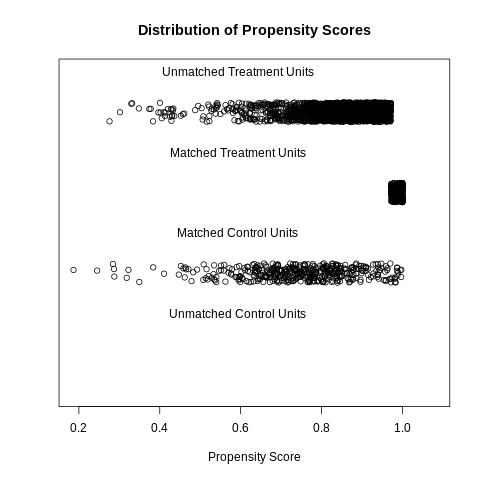

In [ ]:
%%R
plot(m.out, type='jitter')

as we can see, **the above matching is pretty bad** because matched treatment units have different distribution with propensity score with the matched control units. **Matched treatment units have unbalanced high propensity score unit.. Why??**

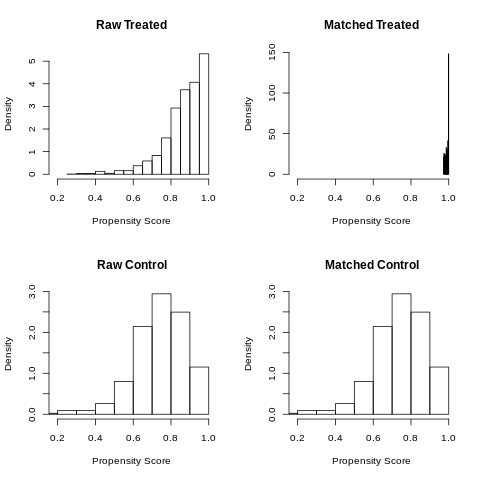

In [ ]:
%%R
plot(m.out, type='hist')

Let's try Coarsened Exact Matching instead

In [ ]:
%%R
# install Coarsened Exact Matching package
install.packages('cem')
library(cem)

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependencies ‘combinat’, ‘randomForest’


R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/combinat_0.0-8.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 9197 bytes

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[

In [ ]:
# -i means pass in some argument/data from python world to R world
%%R -i my_data

m.out <- matchit(SIP.~Median.Household.Income+X..Rural+
                 Population_y+political_diff+
                 X..less.than.18.years.of.age+
                 X..65.and.over+
                 X..Asian+X..Black,
                 method = "cem", data = my_data) # cem means using Coarsened Exact Matching


Using 'treat'='1' as baseline group


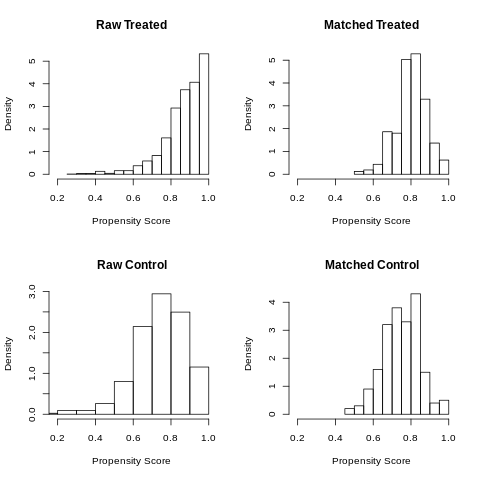

In [ ]:
%%R
plot(m.out, type='hist')

[1] "To identify the units, use first mouse button; to stop, use second."
integer(0)


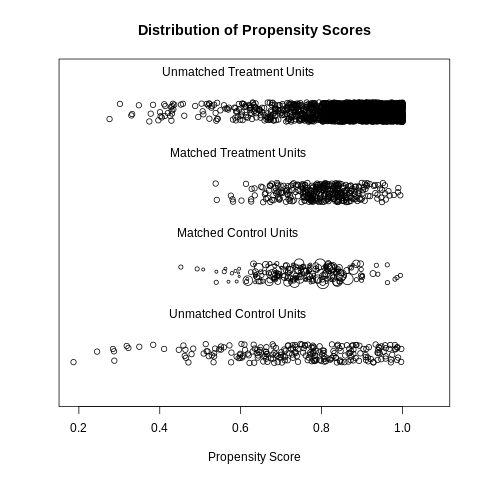

In [ ]:
%%R
plot(m.out, type='jitter')

As we can see, this has a much better distribution for propensity score between matched treatment and control units

In [ ]:
%%R
summary(m.out, standardize=T)


Call:
matchit(formula = SIP. ~ Median.Household.Income + X..Rural + 
    Population_y + political_diff + X..less.than.18.years.of.age + 
    X..65.and.over + X..Asian + X..Black, data = my_data, method = "cem")

Summary of balance for all data:
                             Means Treated Means Control SD Control
distance                            0.8709        0.7450     0.1373
Median.Household.Income         53141.3534    52702.6024 10475.3147
X..Rural                           54.5990       64.2101    29.0150
Population_y                   124760.7827    31246.8918 61574.9617
political_diff                     -0.2793       -0.4199     0.2306
X..less.than.18.years.of.age       21.8399       23.6075     3.2770
X..65.and.over                     18.9089       19.3875     4.1619
X..Asian                            1.7012        1.0052     1.3019
X..Black                           10.6269        4.0901     9.3226
                             Std. Mean Diff. eCDF Med eCDF Mean eCDF Max
d

In [ ]:
%%R
# extract matched data.
matched_data <- match.data(m.out)
dim(matched_data)

[1] 522  18


In [ ]:
# import dataframe from R to python.... since I am not familar with manipulating
# R objects 
matched_data = %R matched_data

In [ ]:
matched_data.head()

,state,state_code,State.Name,cnamelong,county_code,X.diff_stay_at_home,SIP.,Median.Household.Income,X..Rural,Population_y,political_diff,X..less.than.18.years.of.age,X..65.and.over,X..Asian,X..Black,distance,weights,subclass
41,1.0,AL,Alabama,Limestone County,1083,0.135471,1,64863.0,57.6,96174,-0.494518,22.6,15.2,1.6,13.5,0.932989,1.0,1835
60,1.0,AL,Alabama,Talladega County,1121,0.092373,1,41630.0,55.8,79828,-0.255524,21.2,18.0,0.7,32.6,0.968594,1.0,486
63,1.0,AL,Alabama,Walker County,1127,0.074707,1,45434.0,74.1,63711,-0.674418,22.2,19.3,0.6,6.1,0.881996,1.0,1202
101,6.0,CA,California,Colusa County,6011,0.087585,1,57249.0,31.7,21627,-0.135274,27.3,14.6,1.7,1.0,0.655730,1.0,1483
144,6.0,CA,California,Tehama County,6103,0.071885,1,47572.0,51.5,63916,-0.367650,24.0,19.4,1.4,0.7,0.796412,1.0,1123


In [ ]:
matched_data[matched_data['weights'] != 1]

,state,state_code,State.Name,cnamelong,county_code,X.diff_stay_at_home,SIP.,Median.Household.Income,X..Rural,Population_y,political_diff,X..less.than.18.years.of.age,X..65.and.over,X..Asian,X..Black,distance,weights,subclass
2457,5.0,AR,Arkansas,Baxter County,5005,0.086147,0,39686.0,65.8,41619,-0.536072,17.7,30.9,0.5,0.4,0.810564,0.621118,512
2459,5.0,AR,Arkansas,Boone County,5009,0.100015,0,44482.0,62.2,37480,-0.584465,22.9,20.7,0.7,0.4,0.780791,0.310559,517
2464,5.0,AR,Arkansas,Clay County,5021,0.043435,0,37687.0,58.9,14847,-0.297758,21.7,21.4,0.2,0.7,0.813263,0.621118,544
2465,5.0,AR,Arkansas,Cleburne County,5023,0.095560,0,44902.0,75.5,24965,-0.614388,19.0,26.8,0.5,0.4,0.808350,1.242236,666
2467,5.0,AR,Arkansas,Columbia County,5027,0.073214,0,40909.0,57.5,23537,-0.262080,20.7,17.4,1.1,35.3,0.962603,0.621118,486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2852,49.0,UT,Utah,Kane County,49025,0.070038,0,52355.0,54.9,7709,-0.433372,23.5,23.3,0.7,0.6,0.616572,0.310559,1124
2859,56.0,WY,Wyoming,Albany County,56001,0.101694,0,47561.0,11.9,38601,-0.043423,16.3,11.7,3.6,1.8,0.981756,0.621118,825
2864,56.0,WY,Wyoming,Crook County,56011,0.045751,0,64053.0,100.0,7450,-0.815699,24.3,20.6,0.2,1.2,0.631960,1.242236,1712
2866,56.0,WY,Wyoming,Goshen County,56015,0.100431,0,51676.0,46.0,13376,-0.612123,20.1,21.9,0.9,0.9,0.812981,1.863354,1041


In [ ]:
# Average treatment effect:
# see the difference between difference in stay at home % between
# shelter in place counties and non shelter in place counties
matched_data[matched_data['SIP.'] == 1]['X.diff_stay_at_home'].mean() - \
matched_data[matched_data['SIP.'] == 0]['X.diff_stay_at_home'].mean()

0.011919202300043563

In [ ]:
matched_data[matched_data['SIP.'] == 0].head()

,state,state_code,State.Name,cnamelong,county_code,X.diff_stay_at_home,SIP.,Median.Household.Income,X..Rural,Population_y,political_diff,X..less.than.18.years.of.age,X..65.and.over,X..Asian,X..Black,distance,weights,subclass
2457,5.0,AR,Arkansas,Baxter County,5005,0.086147,0,39686.0,65.8,41619,-0.536072,17.7,30.9,0.5,0.4,0.810564,0.621118,512
2459,5.0,AR,Arkansas,Boone County,5009,0.100015,0,44482.0,62.2,37480,-0.584465,22.9,20.7,0.7,0.4,0.780791,0.310559,517
2464,5.0,AR,Arkansas,Clay County,5021,0.043435,0,37687.0,58.9,14847,-0.297758,21.7,21.4,0.2,0.7,0.813263,0.621118,544
2465,5.0,AR,Arkansas,Cleburne County,5023,0.095560,0,44902.0,75.5,24965,-0.614388,19.0,26.8,0.5,0.4,0.808350,1.242236,666
2467,5.0,AR,Arkansas,Columbia County,5027,0.073214,0,40909.0,57.5,23537,-0.262080,20.7,17.4,1.1,35.3,0.962603,0.621118,486


In [ ]:
matched_data[matched_data['SIP.'] == 1].head()

,state,state_code,State.Name,cnamelong,county_code,X.diff_stay_at_home,SIP.,Median.Household.Income,X..Rural,Population_y,political_diff,X..less.than.18.years.of.age,X..65.and.over,X..Asian,X..Black,distance,weights,subclass
41,1.0,AL,Alabama,Limestone County,1083,0.135471,1,64863.0,57.6,96174,-0.494518,22.6,15.2,1.6,13.5,0.932989,1.0,1835
60,1.0,AL,Alabama,Talladega County,1121,0.092373,1,41630.0,55.8,79828,-0.255524,21.2,18.0,0.7,32.6,0.968594,1.0,486
63,1.0,AL,Alabama,Walker County,1127,0.074707,1,45434.0,74.1,63711,-0.674418,22.2,19.3,0.6,6.1,0.881996,1.0,1202
101,6.0,CA,California,Colusa County,6011,0.087585,1,57249.0,31.7,21627,-0.135274,27.3,14.6,1.7,1.0,0.655730,1.0,1483
144,6.0,CA,California,Tehama County,6103,0.071885,1,47572.0,51.5,63916,-0.367650,24.0,19.4,1.4,0.7,0.796412,1.0,1123


We see that weights for this SIP == 0 dataframe is not uniform! need to do weighted average. SIP == 1 dataframe is okay: it has weights all equal to 1

In [ ]:
no_SIP_diff = ((matched_data[matched_data['SIP.'] == 0]['weights'] / \
 matched_data[matched_data['SIP.'] == 0]['weights'].sum()) \
* matched_data[matched_data['SIP.'] == 0]['X.diff_stay_at_home']).sum()

In [ ]:
SIP_diff = matched_data[matched_data['SIP.'] == 1]['X.diff_stay_at_home'].mean()

In [ ]:
SIP_diff - no_SIP_diff

0.014696633159250627

okay, still not much difference even if we used weighted average.. I mean, maybe 1.5% difference is big enough? It is possible people stay at home since cases are going up, so even if their state doesn't issue shelter in place they still change their behavior.

# 2. check that the percentage of stay at home time series of counties without shelter in place issue goes up as well.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
data = pd.read_csv("county_data_with_reduced_covariates.csv")

In [ ]:
data.head()

,state,state_code,State Name,cnamelong,county_code,%diff_stay_at_home,SIP?,Median Household Income,% Rural,Population_y,political_diff,% less than 18 years of age,% 65 and over,% Asian,% Black
0,1.0,AL,Alabama,Autauga County,1001,0.119839,1,59338.0,42.0,55601,-0.494789,23.7,15.6,1.2,19.3
1,1.0,AL,Alabama,Baldwin County,1003,0.112319,1,57588.0,42.3,218022,-0.577862,21.6,20.4,1.2,8.8
2,1.0,AL,Alabama,Barbour County,1005,0.069860,1,34382.0,67.8,24881,-0.056112,20.9,19.4,0.5,48.0
3,1.0,AL,Alabama,Bibb County,1007,0.089074,1,46064.0,68.4,22400,-0.555441,20.5,16.5,0.2,21.1
4,1.0,AL,Alabama,Blount County,1009,0.098240,1,50412.0,90.0,57840,-0.813820,23.2,18.2,0.3,1.5


In [ ]:
# select data with no shelter in place order
data[data['SIP?'] == 0].head() # SIP stands for shelter in place

,state,state_code,State Name,cnamelong,county_code,%diff_stay_at_home,SIP?,Median Household Income,% Rural,Population_y,political_diff,% less than 18 years of age,% 65 and over,% Asian,% Black
2455,5.0,AR,Arkansas,Arkansas County,5001,0.051970,0,43887.0,34.7,17769,-0.305821,22.9,19.6,0.8,24.5
2456,5.0,AR,Arkansas,Ashley County,5003,0.076325,0,41127.0,51.7,20046,-0.365018,22.9,20.4,0.3,24.5
2457,5.0,AR,Arkansas,Baxter County,5005,0.086147,0,39686.0,65.8,41619,-0.536072,17.7,30.9,0.5,0.4
2458,5.0,AR,Arkansas,Benton County,5007,0.156460,0,68978.0,25.2,272608,-0.348571,26.3,13.4,4.1,1.8
2459,5.0,AR,Arkansas,Boone County,5009,0.100015,0,44482.0,62.2,37480,-0.584465,22.9,20.7,0.7,0.4


In [ ]:
# how many counties didn't issue shelter in place?
data[data['SIP?'] == 0].shape[0]

425

However, this data doesn't contain time series data, it averages behavior over all time periods. To see time series, we load another dataset called agg_social_dist_2.csv

In [ ]:
agg_data = pd.read_csv("agg_social_dist_2.csv")

In [ ]:
agg_data.head()

,date_range_start,state,state_code,cnamelong,county_code,days_since_first_case,days_since_shelter,candidate_device_count,device_count,completely_home_device_count,part_time_work_behavior_devices,full_time_work_behavior_devices,delivery_behavior_devices,median_home_dwell_time,median_non_home_dwell_time,median_percentage_time_home,distance_traveled_from_home,Date - first case,Date - shelter in place
0,2020-01-01T00:00:00+10:00,66.0,GU,Guam,66010,-75.0,NaN,0.0,310,98,41,72,0.0,395.312903,NaN,NaN,3.722158e+06,2020-03-16,NaN
1,2020-01-01T00:00:00+10:00,69.0,MP,Rota Municipality,69100,-90.0,NaN,0.0,8,1,1,1,0.0,1069.000000,NaN,NaN,7.430000e+02,2020-03-31,NaN
2,2020-01-01T00:00:00+10:00,69.0,MP,Saipan Municipality,69110,-90.0,NaN,0.0,303,121,33,35,0.0,779.036304,NaN,NaN,NaN,2020-03-31,NaN
3,2020-01-01T00:00:00+10:00,69.0,MP,Tinian Municipality,69120,-90.0,NaN,0.0,12,1,1,3,0.0,0.000000,NaN,NaN,2.156500e+04,2020-03-31,NaN
4,2020-01-01T00:00:00-04:00,23.0,ME,Aroostook County,23003,-93.0,-91.0,0.0,56,20,5,7,0.0,477.000000,NaN,NaN,2.278000e+04,2020-04-03,2020-04-01 00:00:00


In [ ]:
agg_data['completely_home_perc'] = agg_data['completely_home_device_count'] / agg_data['device_count']

In [ ]:
# extract date object from the date string in "date_range_start"
from datetime import datetime
agg_data['date'] = agg_data['date_range_start'].apply(lambda x: datetime.strptime(x[0:10], '%Y-%m-%d'))

In [ ]:
agg_data.head()

,date_range_start,state,state_code,cnamelong,county_code,days_since_first_case,days_since_shelter,candidate_device_count,device_count,completely_home_device_count,part_time_work_behavior_devices,full_time_work_behavior_devices,delivery_behavior_devices,median_home_dwell_time,median_non_home_dwell_time,median_percentage_time_home,distance_traveled_from_home,Date - first case,Date - shelter in place,completely_home_perc,date
0,2020-01-01T00:00:00+10:00,66.0,GU,Guam,66010,-75.0,NaN,0.0,310,98,41,72,0.0,395.312903,NaN,NaN,3.722158e+06,2020-03-16,NaN,0.316129,2020-01-01
1,2020-01-01T00:00:00+10:00,69.0,MP,Rota Municipality,69100,-90.0,NaN,0.0,8,1,1,1,0.0,1069.000000,NaN,NaN,7.430000e+02,2020-03-31,NaN,0.125000,2020-01-01
2,2020-01-01T00:00:00+10:00,69.0,MP,Saipan Municipality,69110,-90.0,NaN,0.0,303,121,33,35,0.0,779.036304,NaN,NaN,NaN,2020-03-31,NaN,0.399340,2020-01-01
3,2020-01-01T00:00:00+10:00,69.0,MP,Tinian Municipality,69120,-90.0,NaN,0.0,12,1,1,3,0.0,0.000000,NaN,NaN,2.156500e+04,2020-03-31,NaN,0.083333,2020-01-01
4,2020-01-01T00:00:00-04:00,23.0,ME,Aroostook County,23003,-93.0,-91.0,0.0,56,20,5,7,0.0,477.000000,NaN,NaN,2.278000e+04,2020-04-03,2020-04-01 00:00:00,0.357143,2020-01-01


In [ ]:
# we are only interested in date and % stay at home and county variable
agg_data = agg_data[['county_code', 'cnamelong', 'state', 'state_code', 'completely_home_perc',\
                     'date']]

In [ ]:
agg_data.head()

,county_code,cnamelong,state,state_code,completely_home_perc,date
0,66010,Guam,66.0,GU,0.316129,2020-01-01
1,69100,Rota Municipality,69.0,MP,0.125000,2020-01-01
2,69110,Saipan Municipality,69.0,MP,0.399340,2020-01-01
3,69120,Tinian Municipality,69.0,MP,0.083333,2020-01-01
4,23003,Aroostook County,23.0,ME,0.357143,2020-01-01


Now we can use pyplot library to plot time series of % stay at home vs date in counties without stay at home orders.

In [ ]:
# getting the county codes of counties without shelter in place.
county_codes_of_no_SIP = data[data['SIP?'] == 0]['county_code'].values

In [ ]:
# a function that takes in a county code and plot time series of % completely
# stay at home of that county.
def plot_time_series_of_county(county_code):
  plt.figure() # creating a new figure to plot on
  county = data[data['county_code'] == county_code]['cnamelong'].values[0]
  state = data[data['county_code'] == county_code]['state_code'].values[0]

  plt.plot(agg_data[agg_data['county_code'] == county_code]['date'], \
           agg_data[agg_data['county_code'] == county_code]['completely_home_perc'])
  plt.xticks(rotation=45)
  plt.xlabel("date")
  plt.ylabel("completely home device percentage")
  plt.title(f'% home devices vs date in {county}, {state}')

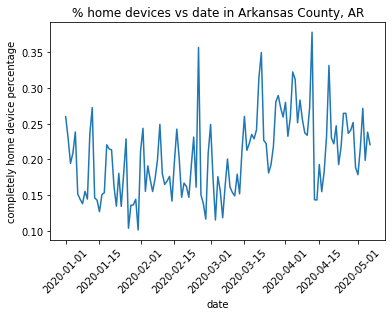

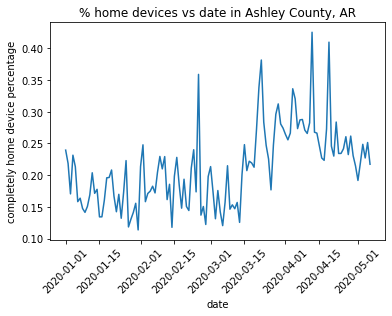

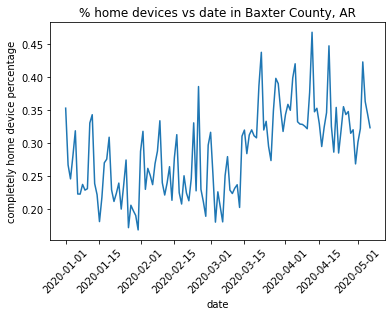

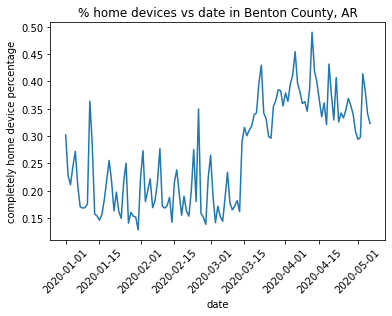

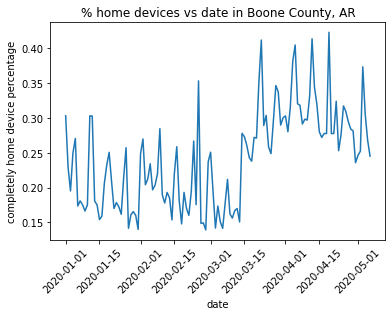

...

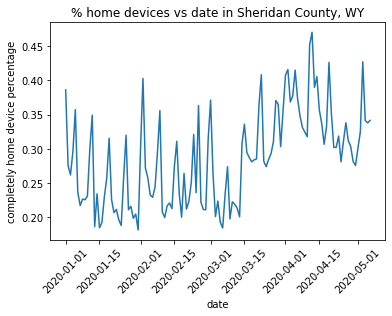

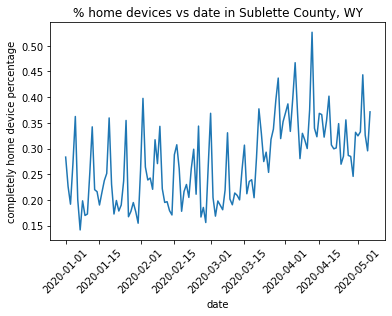

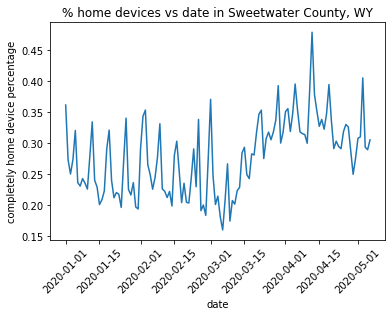

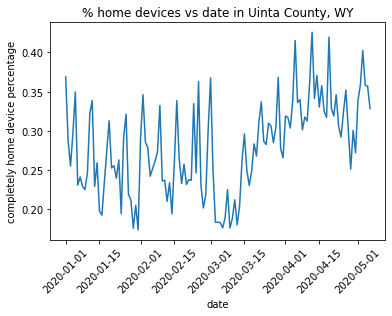

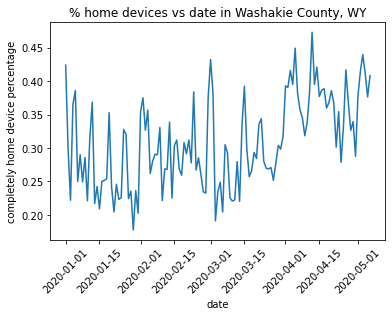

In [ ]:
with plt.rc_context(rc={'figure.max_open_warning': 0}): # turn off warning of displaying too many figures
  for county_code in county_codes_of_no_SIP:
    plot_time_series_of_county(county_code)

As we can see, generally the % of stay at home in counties without shelter in place order still goes up as well (voluntary stay at home because they want to stop spread the virus). 

# 3. try propensity score model with different set of covariates

first need to drop the Null values in our data.

In [ ]:
dataframe = pd.read_csv("county_data_with_reduced_covariates.csv")

In [ ]:
print(f"this dataset has {dataframe.shape[0]} records.")

this dataset has 2880 records.


In [ ]:
dataframe.dropna(inplace=True)

In [ ]:
print(f"after dropping this dataset has {dataframe.shape[0]} records.")

after dropping this dataset has 2878 records.


So we see we only dropped two records, which won't affect our analysis. Let's continue.

In [ ]:
%%R
# install Coarsened Exact Matching package
install.packages('cem')
library(cem)

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependencies ‘combinat’, ‘randomForest’


R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/combinat_0.0-8.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 9197 bytes

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[

In [ ]:
# -i means pass in some argument/data from python world to R world
%%R -i dataframe

# now let's exclude the % 65 and over and % less than 18 because
# they seem to have have SDE in our matching model last time
# when we included all the variables

m.out <- matchit(SIP.~Median.Household.Income+X..Rural+
                 political_diff+Population_y+
                 X..Asian+X..Black,
                 method = "cem", data = dataframe) # cem = coarse exact matching


Using 'treat'='1' as baseline group


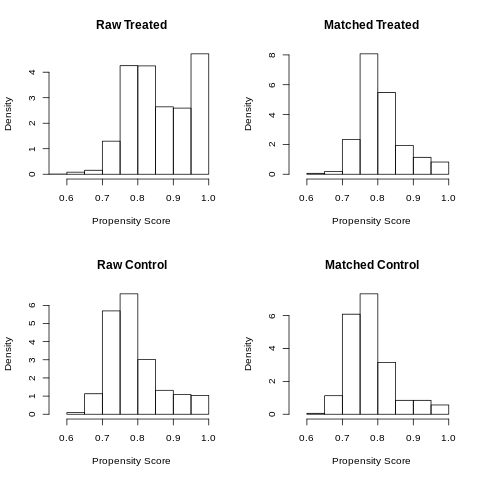

In [ ]:
# to see how maching it soind by visualizing distributions
%%R
plot(m.out, type='hist')

[1] "To identify the units, use first mouse button; to stop, use second."
integer(0)


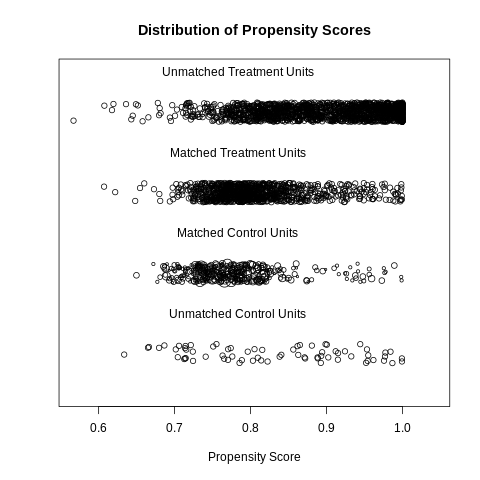

In [ ]:
%%R
plot(m.out, type='jitter')

the matching looks pretty good since the matched treatment and matched control have similar distributions.

In [ ]:
%%R
summary(m.out, standardize=T)


Call:
matchit(formula = SIP. ~ Median.Household.Income + X..Rural + 
    political_diff + Population_y + X..Asian + X..Black, data = dataframe, 
    method = "cem")

Summary of balance for all data:
                        Means Treated Means Control SD Control Std. Mean Diff.
distance                       0.8635        0.7880     0.0736          0.8634
Median.Household.Income    53141.3534    52702.6024 10475.3147          0.0300
X..Rural                      54.5990       64.2101    29.0150         -0.3115
political_diff                -0.2793       -0.4199     0.2306          0.4519
Population_y              124760.7827    31246.8918 61574.9617          0.2551
X..Asian                       1.7012        1.0052     1.3019          0.2328
X..Black                      10.6269        4.0901     9.3226          0.4290
                        eCDF Med eCDF Mean eCDF Max
distance                  0.2804    0.2559   0.4000
Median.Household.Income   0.0469    0.0474   0.0988
X..Rural    

SDE of variables 

In [ ]:
%%R
# extract matched data.
matched_data <- match.data(m.out)

In [ ]:
# import dataframe from R to python.... since I am not familar with manipulating
# R objects 
matched_data = %R matched_data

In [ ]:
no_SIP_diff = ((matched_data[matched_data['SIP.'] == 0]['weights'] / \
 matched_data[matched_data['SIP.'] == 0]['weights'].sum()) \
* matched_data[matched_data['SIP.'] == 0]['X.diff_stay_at_home']).sum()

In [ ]:
SIP_diff = matched_data[matched_data['SIP.'] == 1]['X.diff_stay_at_home'].mean()

In [ ]:
SIP_diff - no_SIP_diff

0.015148164357537061

still 1.5% difference, which matches our past result using 7 covariates together.

Now let's try propensity model without population covariate because it contributes to high SMD last time

In [ ]:
# -i means pass in some argument/data from python world to R world
%%R -i dataframe

# now let's exclude the population covariate

m.out <- matchit(SIP.~Median.Household.Income+X..Rural+
                 political_diff+
                 X..Asian+X..Black,
                 method = "cem", data = dataframe) # cem = coarse exact matching


Using 'treat'='1' as baseline group


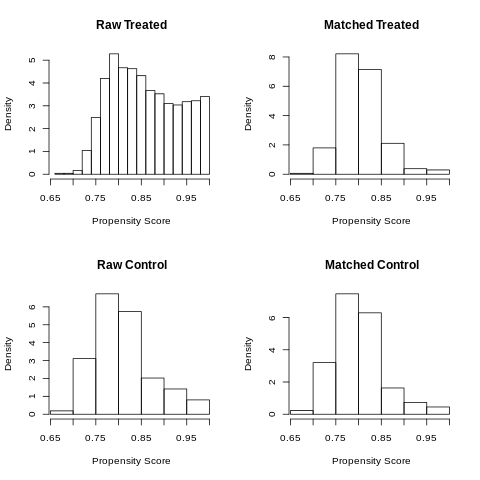

In [ ]:
# to see how maching it soind by visualizing distributions
%%R
plot(m.out, type='hist')


[1] "To identify the units, use first mouse button; to stop, use second."
integer(0)


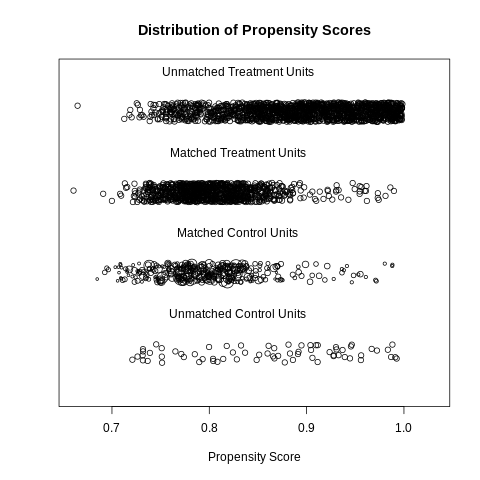

In [ ]:
%%R
plot(m.out, type='jitter')

In [ ]:
%%R
summary(m.out, standardize=T)


Call:
matchit(formula = SIP. ~ Median.Household.Income + X..Rural + 
    political_diff + X..Asian + X..Black, data = dataframe, method = "cem")

Summary of balance for all data:
                        Means Treated Means Control SD Control Std. Mean Diff.
distance                       0.8597        0.8098     0.0642          0.6691
Median.Household.Income    53141.3534    52702.6024 10475.3147          0.0300
X..Rural                      54.5990       64.2101    29.0150         -0.3115
political_diff                -0.2793       -0.4199     0.2306          0.4519
X..Asian                       1.7012        1.0052     1.3019          0.2328
X..Black                      10.6269        4.0901     9.3226          0.4290
                        eCDF Med eCDF Mean eCDF Max
distance                  0.2049    0.1918   0.3154
Median.Household.Income   0.0469    0.0474   0.0988
X..Rural                  0.0958    0.0930   0.1514
political_diff            0.1511    0.1315   0.1973
X..Asia

In [ ]:
%%R
# extract matched data.
matched_data <- match.data(m.out)

In [ ]:
# import dataframe from R to python.... since I am not familar with manipulating
# R objects 
matched_data = %R matched_data

In [ ]:
no_SIP_diff = ((matched_data[matched_data['SIP.'] == 0]['weights'] / \
 matched_data[matched_data['SIP.'] == 0]['weights'].sum()) \
* matched_data[matched_data['SIP.'] == 0]['X.diff_stay_at_home']).sum()

In [ ]:
SIP_diff = matched_data[matched_data['SIP.'] == 1]['X.diff_stay_at_home'].mean()

In [ ]:
SIP_diff - no_SIP_diff

0.01522147914133716

So we still have 1.5% difference as our result with yet another possible set of covariates.

# Conclusion
Seems like 1.5% difference is really there in the data (we tried 3 differnet set of covariates): this means that **the counties that issue stay at home shelter order have 1.5% more increase in percentage of people stay at home in that county after first covid case compared to before first covid case.** \\
example: county 1 has maybe 10% stay at home devices in its population before covid, after first covid it has 20%, (with shelter at home order issued by the county) \\
and county 2 has 10% stay at home, and 18.5% after first covid case (without shelter in place order from county) \\
**upshot is shelter in place order does increase people's stay at home behavior, not by a lot, but by a noticeable amount.**